# Phase 3 - Baseline Model

## Imports

In [0]:
from pyspark.sql import types, functions as F
import pandas as pd
import numpy as np
from pyspark.sql.functions import col, max, row_number
from pyspark.sql.window import Window
from pyspark.ml.tuning import CrossValidator, ParamGridBuilder
from pyspark.ml.evaluation import BinaryClassificationEvaluator

## Configure Databricks blob access

In [0]:
blob_container = "main-storage" # The name of your container created in https://portal.azure.com
storage_account = "team05w261" # The name of your Storage account created in https://portal.azure.com
secret_scope = "team05" # The name of the scope created in your local computer using the Databricks CLI
secret_key = "team05-key" # The name of the secret key created in your local computer using the Databricks CLI 
blob_url = f"wasbs://{blob_container}@{storage_account}.blob.core.windows.net"
mount_path = "/mnt/mids-w261"

# Configure blob storage account access key globally
spark.conf.set(
  f"fs.azure.account.key.{storage_account}.blob.core.windows.net",
  dbutils.secrets.get(scope = secret_scope, key = secret_key)
)

# df = spark.read.parquet(f"{blob_url}/all_time_full_join_1")
# df = spark.read.parquet(f"{blob_url}/2015_q1_full_join_5")
# df = spark.read.parquet(f"{blob_url}/clean_data_1")
# df = spark.read.parquet(f"{blob_url}/all_time_full_join_2_weather_cleaned")
df = spark.read.parquet(f"{blob_url}/all_time_full_join_6")

df_numrows = df.count()
print(f"number of rows: {df_numrows}")
print(f"number of columns: {len(df.columns)}")
display(df)

number of rows: 31178801
number of columns: 362

YEAR_AIRLNS,QUARTER_AIRLNS,MONTH_AIRLNS,DAY_OF_MONTH_AIRLNS,DAY_OF_WEEK_AIRLNS,FL_DATE_AIRLNS,CRS_DEP_TIME_AIRLNS,CRS_ARR_TIME_AIRLNS,CRS_ELAPSED_TIME_AIRLNS,ORIGIN_AIRLNS,DEST_AIRLNS,OP_UNIQUE_CARRIER_AIRLNS,FLIGHTS_AIRLNS,DISTANCE_AIRLNS,DEP_DEL15_AIRLNS,LATITUDE_WTHR_origin,LONGITUDE_WTHR_origin,ELEVATION_WTHR_origin,LATITUDE_WTHR_dest,LONGITUDE_WTHR_dest,ELEVATION_WTHR_dest,WND_WTHR_direction_angle_origin,WND_WTHR_speed_rate_origin,CIG_WTHR_ceiling_height_dimension_origin,VIS_WTHR_distance_dimension_origin,TMP_WTHR_air_temperature_origin,DEW_WTHR_dew_point_temperature_origin,SLP_WTHR_sea_level_pressure_origin,GA1_WTHR_base_height_dimension_origin,GF1_WTHR_lowest_cloud_base_height_dimension_origin,MA1_WTHR_altimeter_setting_rate_origin,MA1_WTHR_station_pressure_rate_origin,AA1_WTHR_period_quantity_in_hours_origin,AA1_WTHR_depth_dimension_origin,AA2_WTHR_period_quantity_in_hours_origin,AA2_WTHR_depth_dimension_origin,AJ1_WTHR_dimension_origin,AJ1_WTHR_equivalent_water_depth_dimension_origin,AL1_WTHR_period_quantity_origin,AL1_WTHR_depth_dimension_origin,AN1_WTHR_period_quantity_origin,AN1_WTHR_depth_dimension_origin,AO1_WTHR_period_quantity_in_minutes_origin,AO1_WTHR_depth_dimension_origin,WND_WTHR_direction_angle_dest,WND_WTHR_speed_rate_dest,CIG_WTHR_ceiling_height_dimension_dest,VIS_WTHR_distance_dimension_dest,TMP_WTHR_air_temperature_dest,DEW_WTHR_dew_point_temperature_dest,SLP_WTHR_sea_level_pressure_dest,GA1_WTHR_base_height_dimension_dest,GF1_WTHR_lowest_cloud_base_height_dimension_dest,MA1_WTHR_altimeter_setting_rate_dest,MA1_WTHR_station_pressure_rate_dest,AA1_WTHR_period_quantity_in_hours_dest,AA1_WTHR_depth_dimension_dest,AA2_WTHR_period_quantity_in_hours_dest,AA2_WTHR_depth_dimension_dest,AJ1_WTHR_dimension_dest,AJ1_WTHR_equivalent_water_depth_dimension_dest,AL1_WTHR_period_quantity_dest,AL1_WTHR_depth_dimension_dest,AN1_WTHR_period_quantity_dest,AN1_WTHR_depth_dimension_dest,AO1_WTHR_period_quantity_in_minutes_dest,AO1_WTHR_depth_dimension_dest,WND_WTHR_type_code_origin-V,WND_WTHR_type_code_origin-C,WND_WTHR_type_code_origin-N,WND_WTHR_type_code_origin-R,WND_WTHR_type_code_origin-H,CIG_WTHR_ceiling_determination_code_origin-M,CIG_WTHR_ceiling_determination_code_origin-C,CIG_WTHR_ceiling_determination_code_origin-W,CIG_WTHR_CAVOK_code_origin-Y,CIG_WTHR_CAVOK_code_origin-N,GA1_WTHR_coverage_code_origin-00,GA1_WTHR_coverage_code_origin-01,GA1_WTHR_coverage_code_origin-02,GA1_WTHR_coverage_code_origin-03,GA1_WTHR_coverage_code_origin-04,GA1_WTHR_coverage_code_origin-05,GA1_WTHR_coverage_code_origin-06,GA1_WTHR_coverage_code_origin-07,GA1_WTHR_coverage_code_origin-08,GA1_WTHR_coverage_code_origin-09,GA1_WTHR_coverage_code_origin-10,GA1_WTHR_cloud_type_code_origin-00,GA1_WTHR_cloud_type_code_origin-01,GA1_WTHR_cloud_type_code_origin-02,GA1_WTHR_cloud_type_code_origin-03,GA1_WTHR_cloud_type_code_origin-04,GA1_WTHR_cloud_type_code_origin-05,GA1_WTHR_cloud_type_code_origin-06,GA1_WTHR_cloud_type_code_origin-07,GA1_WTHR_cloud_type_code_origin-08,GA1_WTHR_cloud_type_code_origin-09,GA1_WTHR_cloud_type_code_origin-10,GA1_WTHR_cloud_type_code_origin-12,GA1_WTHR_cloud_type_code_origin-15,GF1_WTHR_total_coverage_code_origin-00,GF1_WTHR_total_coverage_code_origin-01,GF1_WTHR_total_coverage_code_origin-02,GF1_WTHR_total_coverage_code_origin-03,GF1_WTHR_total_coverage_code_origin-04,GF1_WTHR_total_coverage_code_origin-05,GF1_WTHR_total_coverage_code_origin-06,GF1_WTHR_total_coverage_code_origin-07,GF1_WTHR_total_coverage_code_origin-08,GF1_WTHR_total_coverage_code_origin-09,GF1_WTHR_total_lowest_cloud_cover_code_origin-00,GF1_WTHR_total_lowest_cloud_cover_code_origin-01,GF1_WTHR_total_lowest_cloud_cover_code_origin-02,GF1_WTHR_total_lowest_cloud_cover_code_origin-03,GF1_WTHR_total_lowest_cloud_cover_code_origin-04,GF1_WTHR_total_lowest_cloud_cover_code_origin-05,GF1_WTHR_total_lowest_cloud_cover_code_origin-06,GF1_WTHR_total_lowest_cloud_cover_code_origin-07,GF1_WTHR_total_lowest_cloud_cover_code_origin-08,GF1_WTHR_total_lowest_c

In [0]:
%run ./dataclean_functions

In [0]:
categorical_features = [
  'ORIGIN_AIRLNS',
  'DEST_AIRLNS',
  'OP_UNIQUE_CARRIER_AIRLNS',
  'HOLIDAY',
  'Prev_Flight_Delay_15',
  'Enough_Time_Btwn_Estimate_Arrival_and_Planned_Dep'
]

In [0]:
# Tiny test on the first fold
df_train = undersample(df.filter((F.to_timestamp(F.col('FL_DATE_AIRLNS')) < '2019-01-01')))
df_dev = df.filter((F.to_timestamp(F.col('FL_DATE_AIRLNS')) >= '2019-01-01'))

display(df_train)

YEAR_AIRLNS,QUARTER_AIRLNS,MONTH_AIRLNS,DAY_OF_MONTH_AIRLNS,DAY_OF_WEEK_AIRLNS,FL_DATE_AIRLNS,CRS_DEP_TIME_AIRLNS,CRS_ARR_TIME_AIRLNS,CRS_ELAPSED_TIME_AIRLNS,ORIGIN_AIRLNS,DEST_AIRLNS,OP_UNIQUE_CARRIER_AIRLNS,FLIGHTS_AIRLNS,DISTANCE_AIRLNS,DEP_DEL15_AIRLNS,LATITUDE_WTHR_origin,LONGITUDE_WTHR_origin,ELEVATION_WTHR_origin,LATITUDE_WTHR_dest,LONGITUDE_WTHR_dest,ELEVATION_WTHR_dest,WND_WTHR_direction_angle_origin,WND_WTHR_speed_rate_origin,CIG_WTHR_ceiling_height_dimension_origin,VIS_WTHR_distance_dimension_origin,TMP_WTHR_air_temperature_origin,DEW_WTHR_dew_point_temperature_origin,SLP_WTHR_sea_level_pressure_origin,GA1_WTHR_base_height_dimension_origin,GF1_WTHR_lowest_cloud_base_height_dimension_origin,MA1_WTHR_altimeter_setting_rate_origin,MA1_WTHR_station_pressure_rate_origin,AA1_WTHR_period_quantity_in_hours_origin,AA1_WTHR_depth_dimension_origin,AA2_WTHR_period_quantity_in_hours_origin,AA2_WTHR_depth_dimension_origin,AJ1_WTHR_dimension_origin,AJ1_WTHR_equivalent_water_depth_dimension_origin,AL1_WTHR_period_quantity_origin,AL1_WTHR_depth_dimension_origin,AN1_WTHR_period_quantity_origin,AN1_WTHR_depth_dimension_origin,AO1_WTHR_period_quantity_in_minutes_origin,AO1_WTHR_depth_dimension_origin,WND_WTHR_direction_angle_dest,WND_WTHR_speed_rate_dest,CIG_WTHR_ceiling_height_dimension_dest,VIS_WTHR_distance_dimension_dest,TMP_WTHR_air_temperature_dest,DEW_WTHR_dew_point_temperature_dest,SLP_WTHR_sea_level_pressure_dest,GA1_WTHR_base_height_dimension_dest,GF1_WTHR_lowest_cloud_base_height_dimension_dest,MA1_WTHR_altimeter_setting_rate_dest,MA1_WTHR_station_pressure_rate_dest,AA1_WTHR_period_quantity_in_hours_dest,AA1_WTHR_depth_dimension_dest,AA2_WTHR_period_quantity_in_hours_dest,AA2_WTHR_depth_dimension_dest,AJ1_WTHR_dimension_dest,AJ1_WTHR_equivalent_water_depth_dimension_dest,AL1_WTHR_period_quantity_dest,AL1_WTHR_depth_dimension_dest,AN1_WTHR_period_quantity_dest,AN1_WTHR_depth_dimension_dest,AO1_WTHR_period_quantity_in_minutes_dest,AO1_WTHR_depth_dimension_dest,WND_WTHR_type_code_origin-V,WND_WTHR_type_code_origin-C,WND_WTHR_type_code_origin-N,WND_WTHR_type_code_origin-R,WND_WTHR_type_code_origin-H,CIG_WTHR_ceiling_determination_code_origin-M,CIG_WTHR_ceiling_determination_code_origin-C,CIG_WTHR_ceiling_determination_code_origin-W,CIG_WTHR_CAVOK_code_origin-Y,CIG_WTHR_CAVOK_code_origin-N,GA1_WTHR_coverage_code_origin-00,GA1_WTHR_coverage_code_origin-01,GA1_WTHR_coverage_code_origin-02,GA1_WTHR_coverage_code_origin-03,GA1_WTHR_coverage_code_origin-04,GA1_WTHR_coverage_code_origin-05,GA1_WTHR_coverage_code_origin-06,GA1_WTHR_coverage_code_origin-07,GA1_WTHR_coverage_code_origin-08,GA1_WTHR_coverage_code_origin-09,GA1_WTHR_coverage_code_origin-10,GA1_WTHR_cloud_type_code_origin-00,GA1_WTHR_cloud_type_code_origin-01,GA1_WTHR_cloud_type_code_origin-02,GA1_WTHR_cloud_type_code_origin-03,GA1_WTHR_cloud_type_code_origin-04,GA1_WTHR_cloud_type_code_origin-05,GA1_WTHR_cloud_type_code_origin-06,GA1_WTHR_cloud_type_code_origin-07,GA1_WTHR_cloud_type_code_origin-08,GA1_WTHR_cloud_type_code_origin-09,GA1_WTHR_cloud_type_code_origin-10,GA1_WTHR_cloud_type_code_origin-12,GA1_WTHR_cloud_type_code_origin-15,GF1_WTHR_total_coverage_code_origin-00,GF1_WTHR_total_coverage_code_origin-01,GF1_WTHR_total_coverage_code_origin-02,GF1_WTHR_total_coverage_code_origin-03,GF1_WTHR_total_coverage_code_origin-04,GF1_WTHR_total_coverage_code_origin-05,GF1_WTHR_total_coverage_code_origin-06,GF1_WTHR_total_coverage_code_origin-07,GF1_WTHR_total_coverage_code_origin-08,GF1_WTHR_total_coverage_code_origin-09,GF1_WTHR_total_lowest_cloud_cover_code_origin-00,GF1_WTHR_total_lowest_cloud_cover_code_origin-01,GF1_WTHR_total_lowest_cloud_cover_code_origin-02,GF1_WTHR_total_lowest_cloud_cover_code_origin-03,GF1_WTHR_total_lowest_cloud_cover_code_origin-04,GF1_WTHR_total_lowest_cloud_cover_code_origin-05,GF1_WTHR_total_lowest_cloud_cover_code_origin-06,GF1_WTHR_total_lowest_cloud_cover_code_origin-07,GF1_WTHR_total_lowest_cloud_cover_code_origin-08,GF1_WTHR_total_lowest_c

In [0]:
df_train_ready = df_train.drop('FL_DATE_AIRLNS', *categorical_features)
df_dev_ready = df_dev.drop('FL_DATE_AIRLNS', *categorical_features)

In [0]:
# See that we have a pretty balanced data set
df_train_ready.groupby('dep_del15_airlns').count().show()

+----------------+-------+
dep_del15_airlns| count|
+----------------+-------+
 0.0|4304018|
 1.0|4305495|
+----------------+-------+

In [0]:
# Start putting data into trainable form
from pyspark.ml.feature import VectorAssembler

actual_feature_columns = df_train_ready.columns
actual_feature_columns.remove('DEP_DEL15_AIRLNS')
vectorAssembler = VectorAssembler(inputCols = actual_feature_columns, outputCol = 'features', handleInvalid='skip')
df_train_2 = vectorAssembler.transform(df_train_ready)

df_train_3 = df_train_2.select(['features', 'DEP_DEL15_AIRLNS'])
display(df_train_3)

features,DEP_DEL15_AIRLNS
"Map(vectorType -> sparse, length -> 354, indices -> List(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 35, 39, 42, 44, 45, 47, 48, 49, 58, 64, 71, 104, 117, 208, 216, 247, 352), values -> List(2015.0, 1.0, 1.0, 3.0, 6.0, 734.0, 921.0, 107.0, 1.0, 541.0, 35.2236, -80.9552, 221.9, 40.6386, -73.7622, 3.4, 60.0, 1.5, 12000.0, 8.9, 7.2, 1027.3, 450.0, 450.0, 10132.5, 1000.9, 3.0, 3.0, 1.0, 1.0, 16000.0, -6.7, 1034.2, 6000.0, 10132.5, 1033.1, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 7.0))",0.0
"Map(vectorType -> sparse, length -> 354, indices -> List(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 19, 20, 21, 22, 24, 25, 26, 35, 39, 40, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 58, 64, 71, 102, 209, 216, 249, 262, 352), values -> List(2015.0, 1.0, 1.0, 3.0, 6.0, 1020.0, 1220.0, 120.0, 1.0, 541.0, 40.6386, -73.7622, 3.4, 35.2236, -80.9552, 221.9, 50.0, 3.6, 16000.0, -0.6, -6.1, 1035.7, 6000.0, 10132.5, 1034.7, 1.0, 60.0, 2.1, 12000.0, 8.9, 7.2, 1027.6, 250.0, 250.0, 10132.5, 1001.3, 6.0, 3.0, 24.0, 6.1, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 10.0))",0.0
"Map(vectorType -> sparse, length -> 354, indices -> List(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 27, 35, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 58, 64, 71, 104, 119, 209, 212, 216, 224, 352), values -> List(2015.0, 1.0, 1.0, 5.0, 1.0, 710.0, 857.0, 107.0, 1.0, 453.0, 42.2313, -83.3308, 192.3, 39.87327, -75.22678, 3.0, 270.0, 9.3, 6000.0, -10.6, -15.0, 1028.2, 250.0, 250.0, 10132.5, 1003.9, 3.0, 1.0, 280.0, 6.2, 1433.0, 16093.0, 5.6, -3.9, 1016.6, 1433.0, 1433.0, 1016.6, 1015.5, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 7.0))",0.0
"Map(vectorType -> sparse, length -> 354, indices -> List(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 35, 39, 40, 41, 42, 43, 44, 45, 47, 48, 49, 50, 58, 64, 71, 76, 100, 209, 216, 217, 241, 352), values -> List(2015.0, 1.0, 1.0, 6.0, 2.0, 655.0, 836.0, 101.0, 1.0, 507.0, 27.96194, -82.5403, 5.8, 35.2236, -80.9552, 221.9, 40.0, 2.6, 22000.0, 16093.0, 13.3, 8.9, 1027.1, 7620.0, 7620.0, 1027.1, 1026.7, 1.0, 1.0, 340.0, 1.5, 22000.0, 16093.0, -3.3, -6.7, 1028.7, 6000.0, 1028.4, 1000.3, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 6.0))",0.0
"Map(vectorType -> sparse, length -> 354, indices -> List(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 35, 39, 42, 43, 44, 45, 47, 48, 49, 58, 64, 71, 98, 208, 216, 243, 352), values -> List(2015.0, 1.0, 1.0, 8.0, 4.0, 1658.0, 1910.0, 132.0, 1.0, 541.0, 40.6386, -73.7622, 3.4, 35.2236, -80.9552, 221.9, 290.0, 5.1, 16000.0, -6.1, -17.8, 1028.3, 1750.0, 1750.0, 10132.5, 1027.3, 1.0, 1.0, 16000.0, -5.0, -21.1, 1034.9, 6000.0, 10132.5, 1007.2, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 16.0))",0.0
"Map(vectorType -> sparse, length -> 354, indices -> List(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 35, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 58, 64, 71, 74, 100, 209, 216, 221, 245, 352), values -> List(2015.0, 1.0, 1.0, 9.0, 5.0, 830.0, 1038.0, 128.0, 1.0, 650.0, 25.7881, -80.3169, 8.8, 35.2236, -80.9552, 221.9, 90.0, 2.1, 22000.0, 16093.0, 19.4, 15.6, 1021.9, 1067.0, 1067.0, 1022.0, 1020.9, 1.0, 1.0, 220.0, 6.2, 22000.0, 16093.0, -3.0, -16.0, 860.0, 732.0, 732.0, 1022.7, 994.7, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 8.0))",0.0
"Map(vectorType -> sparse, length -> 354, indices -> List(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 35, 39, 40, 41, 42, 43, 44, 45, 47, 48, 49, 50, 58, 64, 71, 74, 100, 209, 216, 217, 241, 352), values -> List(2015.0, 1.0, 1.0, 10.0, 6.0, 845.0, 1027.0, 102.0, 1.0, 468.0, 28.4339, -81.325, 27.4, 35.2236, -80.9552, 221.9, 350.0, 4.1, 22000.0, 16093.0, 7.2, 3.3, 1027.5, 4267.0, 4267.0, 1027.8, 1023.9, 1.0, 1.0

In [0]:
# Standardization for PCA
from pyspark.ml.feature import StandardScaler
standardScaler = StandardScaler(withMean=True, inputCol='features', outputCol='features_scaled')
scaler = standardScaler.fit(df_train_3)
df_train_4 = scaler.transform(df_train_3).select('features_scaled', 'DEP_DEL15_AIRLNS')

In [0]:
from pyspark.ml.feature import PCA

# Try to perform PCA
pca = PCA(k=200, inputCol='features_scaled', outputCol='features_transformed')
pca_model = pca.fit(df_train_4)
print(pca_model.explainedVariance)

[0.041969388111728484,0.0321555926307118,0.023613449050828034,0.022356889253972206,0.019393944896278496,0.016727709341479432,0.015619863235358473,0.013851408465157736,0.013500836516789539,0.013245049798122263,0.012916732409777946,0.012584234145086855,0.012427424829323632,0.011256300708240166,0.011189197050674666,0.01098424372279304,0.01047988955112756,0.010401697779518656,0.010149128212455618,0.009886726468345127,0.009709247955240051,0.009437911057195136,0.009212079444766217,0.009166716801130053,0.008929454982006738,0.008810772816898406,0.008637894646333435,0.008505005806771458,0.008061080182575875,0.007947523443549754,0.007731143139956383,0.007593036106926967,0.007357340947337156,0.007271969887146677,0.007154805236974515,0.007021287563313501,0.0067685978396242645,0.00666245212465118,0.006459656646696222,0.006056784074183444,0.005952670065678262,0.005762603003528774,0.005656106460554534,0.0055935475893307786,0.0055310307138952824,0.005397676488015412,0.005344037176086957,0.005279894967169094,0.0052399046751565375,0.005199949433321687,0.005178377493050768,0.005166338405707371,0.005125713148291602,0.00511121708827725,0.005027363874208583,0.004995865382878865,0.004976927098801564,0.004953853382018948,0.004927296458619106,0.004920769706878365,0.004913904726145225,0.00489680381284597,0.004888827563036915,0.004886302045231006,0.004875104049073677,0.004874432459191705,0.004867376766713044,0.004865340786230174,0.004863435181520394,0.004861127039682899,0.004860439520112009,0.004859405050715958,0.004858608737552441,0.004857653845184144,0.004857326095994955,0.004856576379213421,0.004855949131061788,0.004855616855501654,0.00485522743868223,0.004854820015742111,0.004854789624823751,0.004854577598195105,0.004854421528213774,0.004854403969950285,0.004854386375135533,0.004854376299670589,0.004854349559877347,0.004854329654453344,0.004854235791636739,0.004854198336200758,0.004853998055790294,0.00485374796604197,0.0048535425067473045,0.004853379172583356,0.0048525006535219215,0.0048522934967506854,0.0048482566081336454,0.004847323303497045,0.0048440603294488335,0.004839750283091276,0.0048260095081149685,0.004820699841756737,0.004819118621477688,0.004799794144630812,0.004793826217127559,0.0047832681479083455,0.004766813606097294,0.004725731716131319,0.004718759831676936,0.0047000039103271855,0.004693224276312089,0.004648336592589989,0.0046248038627937455,0.004601261259465785,0.004568358395608517,0.004459749468356133,0.004408202766185551,0.004253229235748072,0.0041695612608680455,0.004135592900413216,0.004130287890467922,0.004097677274745304,0.00396862908607747,0.003954175290145483,0.0038722802455287055,0.0038589750593494513,0.00373947510460526,0.003673698662341389,0.0036061805317156763,0.003570920386628324,0.0035372529279285715,0.0034409298147077957,0.0033742977445903634,0.0031945901995308135,0.003168434777258342,0.0030173778156280134,0.0029794344267788085,0.002928076628200695,0.0028877030776369088,0.0028360403551833794,0.0027365201401345148,0.002683182098659158,0.002592069416643676,0.0025419912006849955,0.002524186224422089,0.002304358617191251,0.0022651690255950613,0.002232248731406653,0.002127580436076556,0.0020807737908528513,0.001976620608211451,0.0019327285734079978,0.0017836826596629024,0.0017263716166185377,0.0017177018180251401,0.001672749047973296,0.0015475175688850545,0.0014984925844805316,0.0013659398924841181,0.0013462240042266531,0.0013041678534915844,0.0012255143013244062,0.0011277400279487185,0.0010185666392526905,0.0010107726317180894,0.0009749495457963534,0.000752834192085767,0.0007228892860671341,0.0006624161498242664,0.0006552136091140704,0.0006078843427088559,0.0005861967892952881,0.0005107994752718804,0.00048818541295630346,0.0004487215396614269,0.000390691890184267,0.00038688777615176784,0.0002899341545161779,0.00022153379175477724,0.0002098829641328711,0.00019679450798158735,0.00015980555688325338,0.0001442402315648149,3.4345659741586175e-05,3.232225551797057e-05,3.136393824571838e-05,1.310341194171554e-05,1.0092063089556

In [0]:
variances = pca_model.explainedVariance

Out[29]:

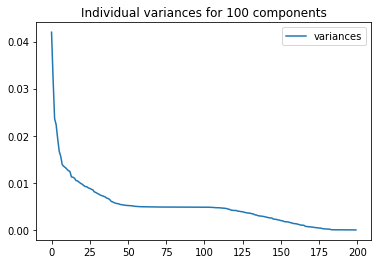

[Text(0.5, 1.0, 'Individual variances for 100 components')]

In [0]:
import seaborn as sns
import pandas as pd

data = pd.DataFrame({'variances': variances}, index=range(len(variances)))

sns.lineplot(data=data).set(title='Individual variances for 100 components')

In [0]:
# for 200 features
sum(variances)

Out[30]: 0.9999999999999716

Out[31]:

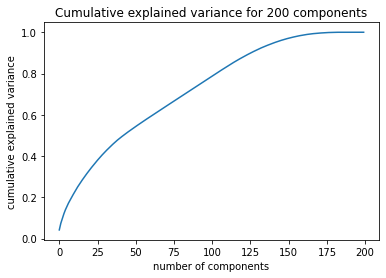

Text(0.5, 1.0, 'Cumulative explained variance for 200 components')

In [0]:
# cumulative explained variance for 200 features
import numpy as np
import matplotlib.pyplot as plt
plt.plot(np.cumsum(variances))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')
plt.title('Cumulative explained variance for 200 components')

In [0]:
# Try to perform PCA
pca = PCA(k=40, inputCol='features_scaled', outputCol='features_transformed')
pca_model = pca.fit(df_train_4)

df_train_5 = pca_model.transform(df_train_4)

In [0]:
from pyspark.ml.classification import LogisticRegression

df_train_6 = df_train_5 \
    .select(['features_transformed', 'DEP_DEL15_AIRLNS']) \
    .withColumnRenamed("DEP_DEL15_AIRLNS", "label") \
    .withColumnRenamed("features_transformed", "features")

lr = LogisticRegression(maxIter=15, regParam=0.05, elasticNetParam=0.05)
lrModel = lr.fit(df_train_6)

print("Coefficients: " + str(lrModel.coefficients))
print("Intercept: " + str(lrModel.intercept))


Coefficients: [0.04431592913155925,0.006801636101043385,0.0,-0.15112281610012224,0.0,0.008415815329987674,-0.10032174707206144,0.014385980717813326,0.0,0.0,-0.025979196846165113,-0.020703214172287227,-0.0629349229928949,-0.022104558857356803,-0.010454355069904919,-0.045411616882154074,-0.00809774567769107,0.0,0.005256346596531265,-0.035201836217876696,0.0,-0.029762859490005168,0.007589678614712343,-0.007352025092207785,0.0,-0.06584312668375288,0.037716909113875804,0.01054410427932126,-0.07584038289594211,0.0,-0.009273281408146473,0.0,0.012394459131976633,0.009626989332817842,0.0003374270873526081,-0.034859698469522596,0.0,0.016288470626568515,0.0,0.0049261441781366135]
Intercept: 0.011713902588129538

In [0]:
vectorAssembler.setHandleInvalid('error')
df_dev_1 = vectorAssembler.transform(df_dev_ready)
df_dev_2 = scaler.transform(df_dev_1)
df_dev_3 = pca_model.transform(df_dev_2)
df_dev_4 = df_dev_3.select(['features_transformed', 'DEP_DEL15_AIRLNS']).withColumnRenamed("DEP_DEL15_AIRLNS", "label").withColumnRenamed("features_transformed", "features")

predictions = lrModel.transform(df_dev_4)

In [0]:
print(lrModel.summary.accuracy)
print(lrModel.summary.weightedPrecision)
print(lrModel.summary.weightedRecall)
print(lrModel.summary.weightedFMeasure(2.0))

0.6132866395898213
0.613973920619999
0.6132866395898213
0.6126494928561027

### Trying to cross validate for some optimal hyperparams

In [0]:
# Optional to explain what these hyperparams do
# lr.explainParam('maxIter')
# lr.explainParam('regParam')

# cross validate for optimal hyperparams
lr = LogisticRegression()
grid = ParamGridBuilder()\
    .addGrid(lr.maxIter, [5, 10, 20])\
    .addGrid(lr.regParam, [.05, .1])\
    .addGrid(lr.elasticNetParam, [0, .5, 1])\
    .build()

# define evaluation metric (AUC and areaUnderPR are the only options...)
bin_eval = BinaryClassificationEvaluator(
    metricName='areaUnderROC' 
    ,labelCol='label'
    )

# perhaps figure out how to customize the folding better for TS data. 
cv = CrossValidator(estimator=lr, evaluator=bin_eval, estimatorParamMaps=grid, numFolds=5)

lr_cv = cv.fit(df_train_transform_ready)

/databricks/spark/python/pyspark/ml/util.py:886: UserWarning: Cannot find mlflow module. To enable MLflow logging, install mlflow from PyPI.
 warnings.warn(_MLflowInstrumentation._NO_MLFLOW_WARNING)

--------------------------------------------------------------------------- 
 NameError Traceback (most recent call last)
 <command-3816960191369709> in <module> 
 22 lr_cv = cv . fit ( df_train_transform_ready ) 
 23 
 ---> 24 cv_fit . bestModel

 NameError : name 'cv_fit' is not defined

In [0]:
# check out optimal hyperparams
lr_cv.getEstimatorParamMaps()[ np.argmax(lr_cv.avgMetrics) ]

Out[109]: {Param(parent='LogisticRegression_575116da8f57', name='maxIter', doc='max number of iterations (>= 0).'): 20,
 Param(parent='LogisticRegression_575116da8f57', name='regParam', doc='regularization parameter (>= 0).'): 0.05,
 Param(parent='LogisticRegression_575116da8f57', name='elasticNetParam', doc='the ElasticNet mixing parameter, in range [0, 1]. For alpha = 0, the penalty is an L2 penalty. For alpha = 1, it is an L1 penalty.'): 0.0}

In [0]:
# build 1 final lr model on optimal hyperparams
# CV so far is saying to use L2 w/ hardly any regularization
lr_final = LogisticRegression(maxIter=20, regParam=.05, elasticNetParam=0)
lr_final = lr_final.fit(df_train_transform_ready)

df_dev_preds = lrModel.transform(df_dev_transform_ready)
df_dev_preds.show(3)

+--------------------+-----+--------------------+--------------------+----------+
 features|label| rawPrediction| probability|prediction|
+--------------------+-----+--------------------+--------------------+----------+
[20.0,5.0,2152.0,...| 0.0|[1.00194827037006...|[0.73144145935348...| 0.0|
[21.0,6.0,2149.0,...| 0.0|[0.83859552972119...|[0.69816933590436...| 0.0|
[21.0,6.0,1925.0,...| 0.0|[0.92550838522593...|[0.71616314641257...| 0.0|
+--------------------+-----+--------------------+--------------------+----------+
only showing top 3 rows

In [0]:
# for some reason trying to access these output columns is causing errors i don't understand...
# trying to use this probability to change the threshold of prediction
df_dev_preds.select('probability').collect()
df_dev_preds.select('prediction').collect()

--------------------------------------------------------------------------- 
 Py4JJavaError Traceback (most recent call last)
 <command-3816960191369895> in <module> 
 1 # for some reason trying to access these derived columns is throwing errors... 
 2 # trying to use this probability to change the threshold of prediction 
 ----> 3 df_dev_preds . select ( 'probability' ) . collect ( ) 
 4 df_dev_preds . select ( 'prediction' ) . collect ( ) 

 /databricks/spark/python/pyspark/sql/dataframe.py in collect (self) 
 695 # Default path used in OSS Spark / for non-DF-ACL clusters: 
 696 with SCCallSiteSync ( self . _sc ) as css : 
 --> 697 sock_info = self . _jdf . collectToPython ( ) 
 698 return list ( _load_from_socket ( sock_info , BatchedSerializer ( PickleSerializer ( ) ) ) ) 
 699 

 /databricks/spark/python/lib/py4j-0.10.9-src.zip/py4j/java_gateway.py in __call__ (self, *args) 
 1302 
 1303 answer = self . gateway_client . send_command ( command ) 
 -> 1304 return_value = get_return_value(
 1305 answer, self.gateway_client, self.target_id, self.name)
 1306 

 /databricks/spark/python/pyspark/sql/utils.py in deco (*a, **kw) 
 115 def deco ( * a , ** kw ) : 
 116 try : 
 --> 117 return f ( * a , ** kw ) 
 118 except py4j . protocol . Py4JJavaError as e : 
 119 converted = convert_exception ( e . java_exception ) 

 /databricks/spark/python/lib/py4j-0.10.9-src.zip/py4j/protocol.py in get_return_value (answer, gateway_client, target_id, name) 
 324 value = OUTPUT_CONVERTER [ type ] ( answer [ 2 : ] , gateway_client ) 
 325 if answer [ 1 ] == REFERENCE_TYPE : 
 --> 326 raise Py4JJavaError(
 327 "An error occurred while calling {0}{1}{2}.\n" . 
 328 format(target_id, ".", name), value)

 Py4JJavaError : An error occurred while calling o22914.collectToPython.
: org.apache.spark.SparkException: Job aborted due to stage failure: Task 3 in stage 3315.0 failed 4 times, most recent failure: Lost task 3.3 in stage 3315.0 (TID 10967) (10.139.64.32 executor 1): org.apache.spark.SparkException: Failed to execute user defined function(VectorAssembler$$Lambda$1336/53330776: (struct<DAY_OF_MONTH_AIRLNS_double_VectorAssembler_c3842e9f5e05:double,DAY_OF_WEEK_AIRLNS_double_VectorAssembler_c3842e9f5e05:double,DEP_TIME_AIRLNS_double_VectorAssembler_c3842e9f5e05:double,CRS_DEP_TIME_AIRLNS_double_VectorAssembler_c3842e9f5e05:double,CRS_ARR_TIME_AIRLNS_double_VectorAssembler_c3842e9f5e05:double,CRS_ELAPSED_TIME_AIRLNS:double,FLIGHTS_AIRLNS:double,DISTANCE_AIRLNS:double,DISTANCE_GROUP_AIRLNS_double_VectorAssembler_c3842e9f5e05:double,LATITUDE_WTHR_origin:double,LONGITUDE_WTHR_origin:double,ELEVATION_WTHR_origin:double,LATITUDE_WTHR_dest:double,LONGITUDE_WTHR_dest:double,ELEVATION_WTHR_dest:double,liquid_precip_depth_millimeters_origin_double_VectorAssembler_c3842e9f5e05:double>) => struct<type:tinyint,size:int,indices:array<int>,values:array<double>>)
	at org.apache.spark.sql.catalyst.expressions.GeneratedClass$SpecificUnsafeProjection.apply(Unknown Source)
	at org.apache.spark.sql.catalyst.expressions.GeneratedClass$SpecificUnsafeProjection.apply(Unknown Source)
	at scala.collection.Iterator$$anon$10.next(Iterator.scala:459)
	at org.apache.spark.sql.catalyst.expressions.GeneratedClass$GeneratedIteratorForCodegenStage1.processNext(Unknown Source)
	at org.apache.spark.sql.execution.BufferedRowIterator.hasNext(BufferedRowIterator.java:43)
	at org.apache.spark.sql.execution.WholeStageCodegenExec$$anon$1.hasNext(WholeStageCodegenExec.scala:757)
	at org.apache.spark.sql.execution.collect.UnsafeRowBatchUtils$.encodeUnsafeRows(UnsafeRowBatchUtils.scala:80)
	at org.apache.spark.sql.execution.collect.Collector.$anonfun$processFunc$1(Collector.scala:178)
	at org.apache.spark.scheduler.ResultTask.$anonfun$runTask$3(ResultTask.scala:75)
	at com.databricks.spark.util.ExecutorFrameProfiler$.record(ExecutorFrameProfiler.scala:110)
	at org.apache.spark.scheduler.ResultTask.$anonfun$runTask$1(ResultTask.scala:75)
	at com.databricks.spark.util.ExecutorFrameProfiler$.rec

In [0]:
# see which threshold maximizes F-score
df_f = lr_final.summary.fMeasureByThreshold
df_f.filter(F.col('F-Measure') == df_f.select(F.max(F.col('F-Measure'))).collect()[0][0]).show()

+-------------------+------------------+
 threshold| F-Measure|
+-------------------+------------------+
0.23729186918797662|0.4640472156948467|
+-------------------+------------------+

In [0]:
print(lr_final.summary.accuracy)
print(lr_final.summary.precisionByLabel)
print(lr_final.summary.recallByLabel)
print(lr_final.summary.weightedFMeasure()) # 1 gives regular f1

0.7516258129064533
[0.7519159576540885, 0.7047244094488189]
[0.9975765539674504, 0.01726965750120598]
0.6508178069804746

--------------------------------------------------------------------------- 
 Py4JError Traceback (most recent call last)
 <command-3816960191369729> in <module> 
 3 print ( lr_final . summary . recallByLabel ) 
 4 print ( lr_final . summary . weightedFMeasure ( ) ) # 1 gives regular f1 
 ----> 5 print ( lr_final . summary . weightedFMeasure ( 2 ) ) 

 /databricks/spark/python/pyspark/ml/classification.py in weightedFMeasure (self, beta) 
 395 Returns weighted averaged f - measure . 
 396 """
 --> 397 return self . _call_java ( "weightedFMeasure" , beta ) 
 398 
 399 

 /databricks/spark/python/pyspark/ml/wrapper.py in _call_java (self, name, *args) 
 52 sc = SparkContext . _active_spark_context
 53 java_args = [ _py2java ( sc , arg ) for arg in args ] 
 ---> 54 return _java2py ( sc , m ( * java_args ) ) 
 55 
 56 @ staticmethod

 /databricks/spark/python/lib/py4j-0.10.9-src.zip/py4j/java_gateway.py in __call__ (self, *args) 
 1302 
 1303 answer = self . gateway_client . send_command ( command ) 
 -> 1304 return_value = get_return_value(
 1305 answer, self.gateway_client, self.target_id, self.name)
 1306 

 /databricks/spark/python/pyspark/sql/utils.py in deco (*a, **kw) 
 115 def deco ( * a , ** kw ) : 
 116 try : 
 --> 117 return f ( * a , ** kw ) 
 118 except py4j . protocol . Py4JJavaError as e : 
 119 converted = convert_exception ( e . java_exception ) 

 /databricks/spark/python/lib/py4j-0.10.9-src.zip/py4j/protocol.py in get_return_value (answer, gateway_client, target_id, name) 
 328 format(target_id, ".", name), value)
 329 else : 
 --> 330 raise Py4JError(
 331 "An error occurred while calling {0}{1}{2}. Trace:\n{3}\n" . 
 332 format(target_id, ".", name, value))

 Py4JError : An error occurred while calling o24885.weightedFMeasure. Trace:
py4j.Py4JException: Method weightedFMeasure([class java.lang.Integer]) does not exist
	at py4j.reflection.ReflectionEngine.getMethod(ReflectionEngine.java:341)
	at py4j.reflection.ReflectionEngine.getMethod(ReflectionEngine.java:349)
	at py4j.Gateway.invoke(Gateway.java:286)
	at py4j.commands.AbstractCommand.invokeMethod(AbstractCommand.java:132)
	at py4j.commands.CallCommand.execute(CallCommand.java:79)
	at py4j.GatewayConnection.run(GatewayConnection.java:251)
	at java.lang.Thread.run(Thread.java:748)

In [0]:
lr_final.summary.weightedFMeasure(2.0)

Out[207]: 0.7068409744943163